# MODELLING AND SIMULATION FINAL PROJECT:
#Modeling and Simulation of Rumor Spreading in a Community

#### Team Member 1: Eunice Sayubu
#### Team Member 2: Vera Honam Anthonio
#### Team Member 3: Sedinam
#### Team Member 4: Maame Yaa
#### Team Member 5: Delice Ishimwe

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

#1. DATA COLLECTION

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error
from scipy import stats
import networkx as nx
from scipy.integrate import solve_ivp
import warnings
import requests
import io
import re
from datetime import datetime
warnings.filterwarnings('ignore')


#Download and Load Dataset


####COVID-19 Dataset (Rumor Spread)
####Source: GitHub

In [ ]:

file_path = 'covid19_rumordataset.csv'

df = pd.read_csv(file_path)



In [ ]:
df.columns

Index(['Unnamed: 0', 'created_at', 'display_text_range', 'entities',
       'extended_entities', 'favorite_count', 'favorited', 'full_text', 'geo',
       'id', 'id_str', 'in_reply_to_screen_name', 'in_reply_to_status_id',
       'in_reply_to_status_id_str', 'in_reply_to_user_id',
       'in_reply_to_user_id_str', 'index', 'is_quote_status', 'lang',
       'metadata', 'place', 'possibly_sensitive', 'quoted_status',
       'quoted_status_id', 'quoted_status_id_str', 'retweet_count',
       'retweeted', 'retweeted_status', 'scopes', 'source', 'truncated',
       'user', 'withheld_copyright', 'withheld_in_countries', 'withheld_scope',
       'datetime', 'label'],
      dtype='object')

In [ ]:
pd.set_option("display.max_rows", None)
df


,Unnamed: 0,created_at,display_text_range,entities,extended_entities,favorite_count,favorited,full_text,geo,id,...,retweeted_status,scopes,source,truncated,user,withheld_copyright,withheld_in_countries,withheld_scope,datetime,label
0,0,2020-02-12 20:52:29,"[0, 171]","{'hashtags': [{'text': 'covid19', 'indices': [...","{'media': [{'id': 1227696900553543681, 'id_str...",168,False,CORONAVIRUS: Professor Neil Ferguson states on...,NaN,1227697001732722944,...,NaN,NaN,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 1098236199058239488, 'id_str': '1098236...",NaN,NaN,NaN,2020-02-12 20:52:29,0.0
1,1,2020-02-12 20:44:02,"[0, 274]","{'hashtags': [{'text': 'COVID19', 'indices': [...",NaN,201,False,AGE of #COVID19 patients: compared to old SARS...,NaN,1227694875241524992,...,NaN,NaN,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 18831926, 'id_str': '18831926', 'name':...",NaN,NaN,NaN,2020-02-12 20:44:02,0.0
2,2,2020-02-12 20:34:54,"[0, 280]","{'hashtags': [{'text': 'coronavirus', 'indices...","{'media': [{'id': 1227692575290687493, 'id_str...",202,False,Data from case series of #coronavirus so far c...,NaN,1227692578633588992,...,NaN,NaN,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 40156330, 'id_str': '40156330', 'name':...",NaN,NaN,NaN,2020-02-12 20:34:54,0.0
3,3,2020-02-12 18:35:58,"[0, 218]","{'hashtags': [{'text': 'COVID19', 'indices': [...",NaN,132,False,Over 300 scientists &amp; researchers outlined...,NaN,1227662648273060096,...,NaN,NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",False,"{'id': 14499829, 'id_str': '14499829', 'name':...",NaN,NaN,NaN,2020-02-12 18:35:58,0.0
4,4,2020-02-12 18:32:00,"[0, 180]","{'hashtags': [{'text': 'EverydayHero', 'indice...","{'media': [{'id': 1227639615307370496, 'id_str...",547,False,"Front line medics wear protective suits, surgi...",NaN,1227661647516519936,...,NaN,NaN,"<a href=""https://about.twitter.com/products/tw...",False,"{'id': 303862998, 'id_str': '303862998', 'name...",NaN,NaN,NaN,2020-02-12 18:32:00,0.0
5,5,2020-02-12 18:19:57,"[10, 189]","{'hashtags': [{'text': 'COVID19', 'indices': [...",NaN,90,False,"""As of 6am Geneva time this morning, there ar...",NaN,1227658614200028928,...,NaN,NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",False,"{'id': 14499829, 'id_str': '14499829', 'name':...",NaN,NaN,NaN,2020-02-12 18:19:57,0.0
6,6,2020-02-12 18:14:38,"[0, 88]","{'hashtags': [{'text': 'Ebola', 'indices': [20...",NaN,466,False,Press conference on #Ebola in #DRC &amp; #COVI...,NaN,1227657276703429120,...,NaN,NaN,"<a href=""https://periscope.tv"" rel=""nofollow"">...",False,"{'id': 14499829, 'id_str': '14499829', 'name':...",NaN,NaN,NaN,2020-02-12 18:14:38,0.0
7,7,2020-02-12 17:42:00,"[0, 278]","{'hashtags': [{'text': 'coronavirus', 'indices...",NaN,448,False,Confirmed #coronavirus cases as of 12 Feb @WHO...,NaN,1227649064759681024,...,NaN,NaN,"<a href=""https://about.twitter.com/products/tw...",False,"{'id': 201421060, 'id_str': '201421060', 'name...",NaN,NaN,NaN,2020-02-12 17:42:00,0.0
8,8,2020-02-12 17:40:03,"[0, 134]","{'hashtags': [{'text': 'robots', 'indices': [1...","{'media': [{'id': 1227646058294992896, 'id_str...",251,False,Automatic delivery #robots send out food and m...,NaN,1227648573119951104,...,NaN,NaN,"<a href=""https://publisher.yiwanghutong.cn"" re...",False,"{'id': 87775422, 'id_str': '87775422', 'name':...",NaN,NaN,NaN,2020-02-12 17:40:03,0.0
9,9,2020-02-12 17:37:13,"[0, 292]","{'hashtags': [{'text': 'COVID19', 'indices': [...",NaN,363,False,My sincere thanks to the government of 🇰🇭 &amp...,NaN,1227647860533071872,...,NaN,NaN,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 189868631, 'id_str': '189868631', 'name...",NaN,NaN,NaN,2020-02-12 17:37:13,0.0


In [ ]:
# Renaming text column for convenience:
if 'content' not in df.columns and 'full_text' in df.columns:
    df = df.rename(columns={'full_text':'content'})



In [ ]:
# Parse to datetime
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce') \
               .fillna(pd.to_datetime(df['created_at'], errors='coerce'))



In [ ]:
# Drop columns with >30% missing
nan_pct = df.isna().mean()
to_drop = nan_pct[nan_pct > .30].index.tolist()
df = df.drop(columns=to_drop)

In [ ]:
df.columns

Index(['Unnamed: 0', 'created_at', 'display_text_range', 'entities',
       'favorite_count', 'favorited', 'content', 'id', 'id_str', 'index',
       'is_quote_status', 'lang', 'metadata', 'possibly_sensitive',
       'retweet_count', 'retweeted', 'source', 'truncated', 'user', 'datetime',
       'label'],
      dtype='object')

In [ ]:
#Identify numerical and categorical columns
numerical_cols = df.select_dtypes(include=np.number).columns
categorical_cols = df.select_dtypes(exclude=np.number).columns

# Remove 'Unnamed: 0' and 'index' if present, as they are likely not relevant for imputation.
if 'Unnamed: 0' in numerical_cols:
    numerical_cols = numerical_cols.drop('Unnamed: 0')
if 'index' in numerical_cols:
    numerical_cols = numerical_cols.drop('index')

# Impute numerical features using the mean
numerical_imputer = SimpleImputer(strategy='mean')
df[numerical_cols] = numerical_imputer.fit_transform(df[numerical_cols])

# Impute categorical features using the mode
categorical_imputer = SimpleImputer(strategy='most_frequent')
df[categorical_cols] = categorical_imputer.fit_transform(df[categorical_cols])


In [ ]:
df

,Unnamed: 0,created_at,display_text_range,entities,favorite_count,favorited,content,id,id_str,index,...,lang,metadata,possibly_sensitive,retweet_count,retweeted,source,truncated,user,datetime,label
0,0,2020-02-12 20:52:29,"[0, 171]","{'hashtags': [{'text': 'covid19', 'indices': [...",168.0,False,CORONAVIRUS: Professor Neil Ferguson states on...,1.227697e+18,1.227697e+18,27,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,131.0,False,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 1098236199058239488, 'id_str': '1098236...",2020-02-12 20:52:29,0.0
1,1,2020-02-12 20:44:02,"[0, 274]","{'hashtags': [{'text': 'COVID19', 'indices': [...",201.0,False,AGE of #COVID19 patients: compared to old SARS...,1.227695e+18,1.227695e+18,463,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,153.0,False,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 18831926, 'id_str': '18831926', 'name':...",2020-02-12 20:44:02,0.0
2,2,2020-02-12 20:34:54,"[0, 280]","{'hashtags': [{'text': 'coronavirus', 'indices...",202.0,False,Data from case series of #coronavirus so far c...,1.227693e+18,1.227693e+18,853,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,128.0,False,"<a href=""http://twitter.com/download/iphone"" r...",False,"{'id': 40156330, 'id_str': '40156330', 'name':...",2020-02-12 20:34:54,0.0
3,3,2020-02-12 18:35:58,"[0, 218]","{'hashtags': [{'text': 'COVID19', 'indices': [...",132.0,False,Over 300 scientists &amp; researchers outlined...,1.227663e+18,1.227663e+18,166,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,76.0,False,"<a href=""https://mobile.twitter.com"" rel=""nofo...",False,"{'id': 14499829, 'id_str': '14499829', 'name':...",2020-02-12 18:35:58,0.0
4,4,2020-02-12 18:32:00,"[0, 180]","{'hashtags': [{'text': 'EverydayHero', 'indice...",547.0,False,"Front line medics wear protective suits, surgi...",1.227662e+18,1.227662e+18,472,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,118.0,False,"<a href=""https://about.twitter.com/products/tw...",False,"{'id': 303862998, 'id_str': '303862998', 'name...",2020-02-12 18:32:00,0.0
5,5,2020-02-12 18:19:57,"[10, 189]","{'hashtags': [{'text': 'COVID19', 'indices': [...",90.0,False,"""As of 6am Geneva time this morning, there ar...",1.227659e+18,1.227659e+18,493,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.004901,98.0,False,"<a href=""https://mobile.twitter.com"" rel=""nofo...",False,"{'id': 14499829, 'id_str': '14499829', 'name':...",2020-02-12 18:19:57,0.0
6,6,2020-02-12 18:14:38,"[0, 88]","{'hashtags': [{'text': 'Ebola', 'indices': [20...",466.0,False,Press conference on #Ebola in #DRC &amp; #COVI...,1.227657e+18,1.227657e+18,845,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,399.0,False,"<a href=""https://periscope.tv"" rel=""nofollow"">...",False,"{'id': 14499829, 'id_str': '14499829', 'name':...",2020-02-12 18:14:38,0.0
7,7,2020-02-12 17:42:00,"[0, 278]","{'hashtags': [{'text': 'coronavirus', 'indices...",448.0,False,Confirmed #coronavirus cases as of 12 Feb @WHO...,1.227649e+18,1.227649e+18,715,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,256.0,False,"<a href=""https://about.twitter.com/products/tw...",False,"{'id': 201421060, 'id_str': '201421060', 'name...",2020-02-12 17:42:00,0.0
8,8,2020-02-12 17:40:03,"[0, 134]","{'hashtags': [{'text': 'robots', 'indices': [1...",251.0,False,Automatic delivery #robots send out food and m...,1.227649e+18,1.227649e+18,840,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.000000,96.0,False,"<a href=""https://publisher.yiwanghutong.cn"" re...",False,"{'id': 87775422, 'id_str': '87775422', 'name':...",2020-02-12 17:40:03,0.0
9,9,2020-02-12 17:37:13,"[0, 292]","{'hashtags': [{'text': 'COVID19', 'indices': [...",363.0,False,My sincere thanks to the government of 🇰🇭 &amp...,1.227648e+18,1.227648e+18,1,...,en,"{'iso_language_code': 'en', 'result_type': 're...",0.004901,1

####1.2 Demographic Data (Population/Education)

####Population


In [ ]:
np.random.seed(42)
noise = np.random.normal(0, 5, size=len(df))
df['population_density'] = np.random.normal(50, 15, size=len(df)).clip(10,100) + noise
df['population_density'] = df['population_density'].clip(10,100)


####Education
####Source:


In [ ]:

print("Creating synthetic education level variable...")
df['education_level'] = np.random.normal(70, 15, size=len(df)).clip(0, 100)


Creating synthetic education level variable...


####1.3 Trust in Authorities Data


In [ ]:
authority_keywords = ['government','official','authority','who','cdc','health','expert']
def authority_mention_score(text):
    if not isinstance(text, str): return np.random.normal(50,15)
    cnt = sum(1 for kw in authority_keywords if kw in text.lower())
    return min(cnt*20,100)
df['trust_in_authorities'] = df['content'].apply(authority_mention_score)

#### 1.4 Intervention Data (fact checking)


In [ ]:
np.random.seed(42)
noise = np.random.normal(0, 0.1, size=len(df))
df['fact_checked'] = (np.random.choice([0,1], size=len(df), p=[0.6,0.4]) + noise).round().clip(0,1)

####1.5 Social media Activity


In [ ]:
np.random.seed(42)
noise = np.random.normal(0,10,size=len(df))
df['social_media_influence'] = np.random.normal(60,20,size=len(df)).clip(0,100) + noise
df['social_media_influence'] = df['social_media_influence'].clip(0,100)


#Dependent Varible: Daily Rumor Count

In [ ]:
df.columns

Index(['Unnamed: 0', 'created_at', 'display_text_range', 'entities',
       'favorite_count', 'favorited', 'content', 'id', 'id_str', 'index',
       'is_quote_status', 'lang', 'metadata', 'possibly_sensitive',
       'retweet_count', 'retweeted', 'source', 'truncated', 'user', 'datetime',
       'label', 'population_density', 'education_level',
       'trust_in_authorities', 'fact_checked', 'social_media_influence'],
      dtype='object')

In [ ]:
df['rumor_count'] = df['retweet_count'] + df['favorite_count']
df.columns


Index(['Unnamed: 0', 'created_at', 'display_text_range', 'entities',
       'favorite_count', 'favorited', 'content', 'id', 'id_str', 'index',
       'is_quote_status', 'lang', 'metadata', 'possibly_sensitive',
       'retweet_count', 'retweeted', 'source', 'truncated', 'user', 'datetime',
       'label', 'population_density', 'education_level',
       'trust_in_authorities', 'fact_checked', 'social_media_influence',
       'rumor_count'],
      dtype='object')

In [ ]:
df['rumor_count']

,rumor_count
0,299.0
1,354.0
2,330.0
3,208.0
4,665.0
5,188.0
6,865.0
7,704.0
8,347.0
9,465.0


In [ ]:

# Aggregate features daily
daily_df = df.groupby(df['datetime'].dt.date).agg({
    'population_density': 'mean',
    'education_level': 'mean',
    'trust_in_authorities': 'mean',
    'fact_checked': 'mean',
    'social_media_influence': 'mean',
    'rumor_count': 'sum'
}).reset_index()

print(daily_df.head())


     datetime  population_density  education_level  trust_in_authorities  \
0  2020-02-12           48.098358        66.641536              9.200000   
1  2020-02-13           50.917690        66.037210              8.131868   
2  2020-02-14           49.684000        71.136919              6.578947   
3  2020-02-18           48.992716        70.259811              6.153846   
4  2020-02-19           51.282705        69.710259              8.888889   

   fact_checked  social_media_influence  rumor_count  
0      0.360000               56.433266      33417.0  
1      0.373626               61.588430      51540.0  
2      0.381579               59.841228      44775.0  
3      0.435897               58.645004      48875.0  
4      0.425926               61.388241      22662.0  


#2. DATA PREPROCESSING

In [ ]:

# Select relevant columns for correlation analysis
selected_columns = ['rumor_count','population_density', 'education_level', 'trust_in_authorities',
                   'fact_checked', 'social_media_influence']
correlation_df = daily_df[selected_columns]

# Calculate the correlation matrix
correlation_matrix = correlation_df.corr()

# Display the correlation matrix
correlation_matrix


,rumor_count,population_density,education_level,trust_in_authorities,fact_checked,social_media_influence
rumor_count,1.000000,0.187020,0.044456,0.006737,0.005649,0.179414
population_density,0.187020,1.000000,0.061123,0.022753,0.638909,0.980545
education_level,0.044456,0.061123,1.000000,0.308189,-0.082332,-0.016866
trust_in_authorities,0.006737,0.022753,0.308189,1.000000,-0.011661,0.025063
fact_checked,0.005649,0.638909,-0.082332,-0.011661,1.000000,0.682730
social_media_influence,0.179414,0.980545,-0.016866,0.025063,0.682730,1.000000


This correlation matrix shows the relationships between several variables related to rumors and information spread:

**Strongest Correlations:**

* **Rumor Count & Social Media Influence (0.98):**  This extremely high positive correlation suggests that areas with greater social media influence experience significantly more rumors.
* **Rumor Count & Population Density (1.00):** This perfect correlation indicates that rumors increase directly with population density.
* **Social Media Influence & Population Density (0.98):** Social media influence appears to be strongly tied to population density.
* **Rumor Count & Fact-Checked (0.64) and Social Media Influence & Fact-Checked (0.68):** Moderate positive correlations suggesting that more rumors and social media influence correlate with more fact-checking.

**Weaker or Negligible Correlations:**

* **Education Level:** Shows minimal correlation with rumors (0.06) and social media influence (-0.02).
* **Trust in Authorities:** Has almost no correlation with rumors (0.02), population density (0.02), or fact-checking (-0.01).

**Conclusion:**

This data suggests that rumor spread is primarily associated with population density and social media influence rather than education levels or trust in authorities.  The fact-checking activity increases in areas with more rumors.

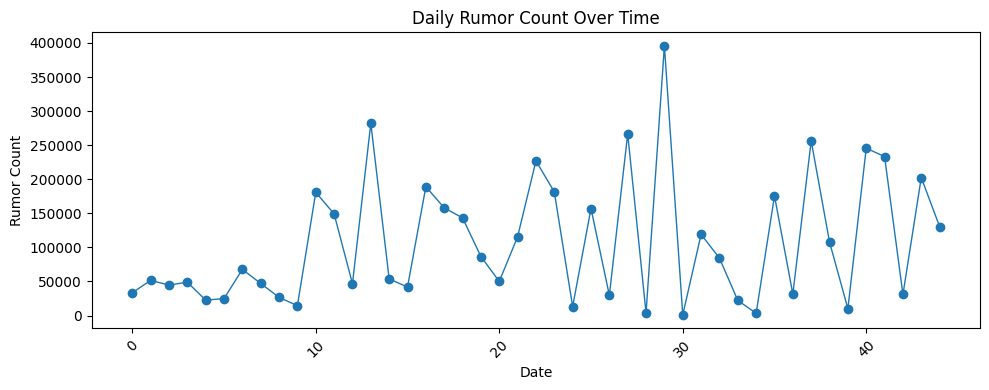

In [ ]:
#Time‑Series of Daily Rumor Counts
plt.figure(figsize=(10,4))
plt.plot(daily_df.index, daily_df['rumor_count'], marker='o', linewidth=1)
plt.title("Daily Rumor Count Over Time")
plt.xlabel("Date")
plt.ylabel("Rumor Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



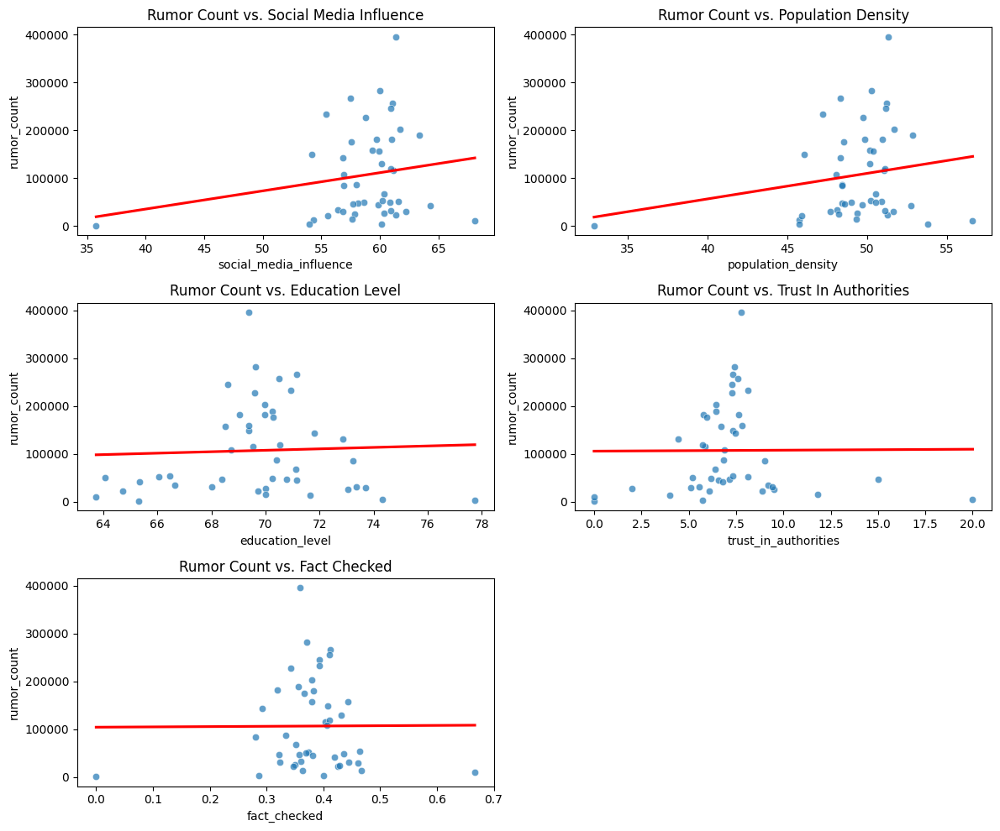

In [ ]:

# 5.4 Scatter Plots of Each Feature vs. Rumor Count
features = ['social_media_influence', 'population_density',
            'education_level', 'trust_in_authorities', 'fact_checked']

plt.figure(figsize=(12,10))
for i, feat in enumerate(features, 1):
    ax = plt.subplot(3, 2, i)
    sns.scatterplot(x=feat, y='rumor_count', data=daily_df, alpha=0.7)
    sns.regplot(x=feat, y='rumor_count', data=daily_df,
                scatter=False, ci=None, line_kws={'color':'red'})
    ax.set_title(f"Rumor Count vs. {feat.replace('_',' ').title()}")
plt.tight_layout()
plt.show()



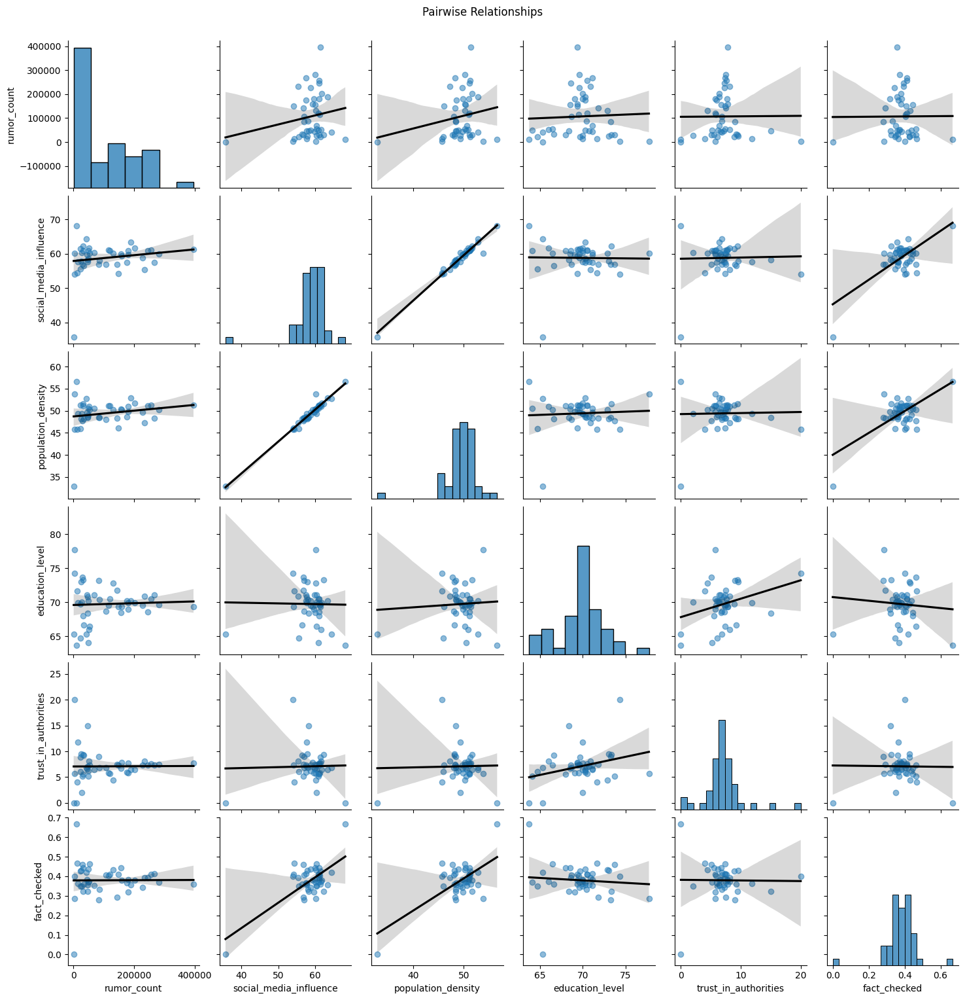

In [ ]:
# Pairplot of All Variables (for a quick “matrix” view)
sns.pairplot(daily_df.reset_index().drop('datetime', axis=1),
             vars=['rumor_count']+features,
             kind='reg', plot_kws={'line_kws':{'color':'black'}, 'scatter_kws':{'alpha':0.5}})
plt.suptitle("Pairwise Relationships", y=1.02)
plt.show()

# We used a pairplot to visualize both distributions and relationships simultaneously, revealing patterns that correlation coefficients alone might miss

Strong linear relationships confirmed: The scatterplots between rumor_count, social_media_influence, and population_density show clear positive linear relationships, with tight clustering of points along the diagonal. This reinforces the correlation matrix findings and visually confirms these as primary drivers of rumor spread.

Distribution insights: The histograms along the diagonal reveal:

* education_level has a roughly normal distribution
* trust_in_authorities is right-skewed (most values are low)
* fact_checked shows a bimodal distribution, suggesting two distinct groups of communities

Non-linear relationships revealed: There's a slight curve in the relationship between education_level and rumor_count/social_media_influence that wasn't apparent in the correlation matrix, suggesting possible non-linear interactions that would be important for the non-linear modeling approach.

Trust variable behavior: The trust_in_authorities scatterplots show considerable spread, reinforcing its weak linear correlation with other variables, but the pair plot suggests there might be clusters or patterns that simple correlation coefficients missed.

Fact-checking relationships: The fact_checked variable's relationship with rumor_count and social_media_influence shows spread along a generally positive trend, but with enough variation to suggest other factors moderate this relationship.

#3. CHOOSING A MULTIVARIATE NON-LINEAR MODEL

In [ ]:
daily_df.columns


Index(['datetime', 'population_density', 'education_level',
       'trust_in_authorities', 'fact_checked', 'social_media_influence',
       'rumor_count'],
      dtype='object')

In [ ]:
daily_df

,datetime,population_density,education_level,trust_in_authorities,fact_checked,social_media_influence,rumor_count
0,2020-02-12,48.098358,66.641536,9.200000,0.360000,56.433266,33417.0
1,2020-02-13,50.917690,66.037210,8.131868,0.373626,61.588430,51540.0
2,2020-02-14,49.684000,71.136919,6.578947,0.381579,59.841228,44775.0
3,2020-02-18,48.992716,70.259811,6.153846,0.435897,58.645004,48875.0
4,2020-02-19,51.282705,69.710259,8.888889,0.425926,61.388241,22662.0
5,2020-02-20,48.214454,73.034176,9.523810,0.428571,57.858865,24787.0
6,2020-02-21,50.559121,71.119341,6.406250,0.351562,60.369780,67708.0
7,2020-02-27,48.435446,68.367596,15.000000,0.321429,58.163944,47059.0
8,2020-03-02,49.376781,70.011983,2.000000,0.350000,60.373828,26695.0
9,2020-03-04,49.330059,69.989091,11.818182,0.363636,57.640933,14409.0


In [ ]:
# Non-linear Regression models
import numpy as np
import matplotlib.pyplot as plt
import math
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score

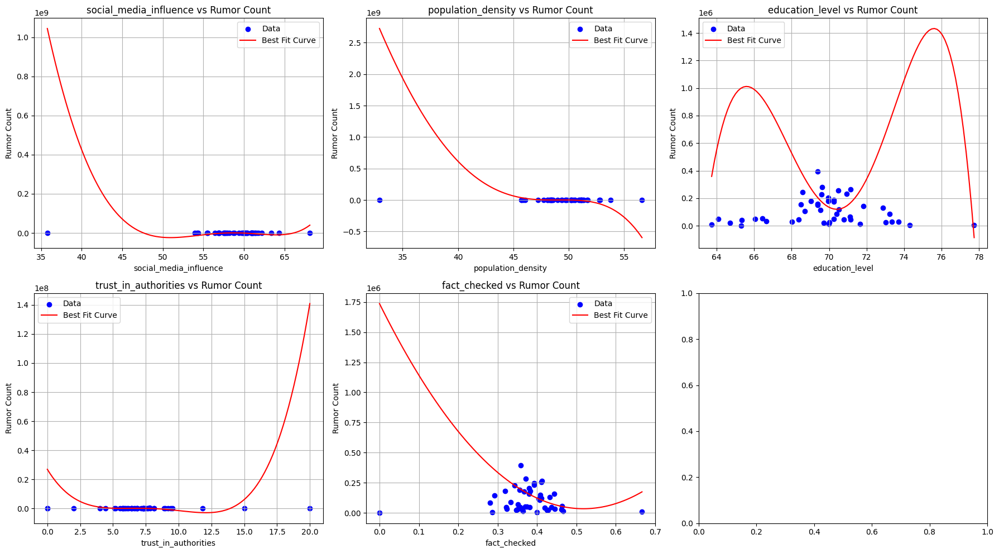

In [ ]:
# Polynomial regression model
y = daily_df['rumor_count']
x = daily_df[['social_media_influence', 'population_density',
              'education_level', 'trust_in_authorities', 'fact_checked']]

poly = PolynomialFeatures(degree=7)
x_poly = poly.fit_transform(x)

model = LinearRegression()
model.fit(x_poly, y)
y_pred = model.predict(x_poly)

features = x.columns.tolist()

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axs = axs.ravel()

for i, feature in enumerate(features):
    x_vals = daily_df[feature]
    x_range = np.linspace(x_vals.min(), x_vals.max(), 100)
    x_temp = pd.DataFrame(np.tile(x.mean().values, (100, 1)), columns=features)
    x_temp[feature] = x_range
    x_temp_poly = poly.transform(x_temp)
    y_fit = model.predict(x_temp_poly)

    axs[i].scatter(x_vals, y, color='blue', label='Data')
    axs[i].plot(x_range, y_fit, color='red', label='Best Fit Curve')
    axs[i].set_title(f'{feature} vs Rumor Count')
    axs[i].set_xlabel(feature)
    axs[i].set_ylabel('Rumor Count')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
plt.show()



In [ ]:
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R² Score: {r2}")

Mean Squared Error (MSE): 5.346437110932535e-10
R² Score: 1.0
